# Requirements and checks

In [4]:
!pip install ultralytics
!pip install roboflow

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.7/40.7 kB 4.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.6/60.6 kB 9.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 159.5/159.5 kB 7.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 755.2/755.2 kB 23.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.6/11.6 MB 48.8 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.2/62.2 MB 34.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.0/13.0 MB 50.6 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 38.6/38.6 MB 40.4 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 294.9/294.9 kB 35.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 305.2/305.2 kB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.6/4.6 MB 26.1 MB/s eta 0:00:0000:0100:01
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 54.0 MB/s eta 0:00

In [2]:
!nvidia-smi

Fri May  3 23:14:54 2024       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 550.76.01              Driver Version: 552.22         CUDA Version: 12.4     |
|-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  NVIDIA GeForce RTX 4060 ...    On  |   00000000:01:00.0  On |                  N/A |
| N/A   47C    P8              3W /  105W |     776MiB /   8188MiB |      7%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [3]:
import torch
print(torch.cuda.is_available())
print(torch.cuda.device_count())
print(torch.version.cuda)

True
1
12.1


In [4]:
!yolo checks

Ultralytics YOLOv8.2.8 🚀 Python-3.10.13 torch-2.2.1 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Setup complete ✅ (16 CPUs, 7.6 GB RAM, 107.3/1006.9 GB disk)

OS                  Linux-5.15.133.1-microsoft-standard-WSL2-x86_64-with-glibc2.35
Environment         Docker
Python              3.10.13
Install             pip
RAM                 7.61 GB
CPU                 12th Gen Intel Core(TM) i7-12650H
CUDA                12.1

matplotlib          ✅ 3.8.4>=3.3.0
opencv-python       ✅ 4.9.0.80>=4.6.0
pillow              ✅ 10.2.0>=7.1.2
pyyaml              ✅ 6.0.1>=5.3.1
requests            ✅ 2.31.0>=2.23.0
scipy               ✅ 1.13.0>=1.4.1
torch               ✅ 2.2.1>=1.8.0
torchvision         ✅ 0.17.1>=0.9.0
tqdm                ✅ 4.65.0>=4.64.0
psutil              ✅ 5.9.0
py-cpuinfo          ✅ 9.0.0
thop                ✅ 0.1.1-2209072238>=0.1.1
pandas              ✅ 2.2.2>=1.1.4
seaborn             ✅ 0.13.2>=0.11.0


# purr.model

### 1. Get the dataset

In [2]:
import os
HOME = os.getcwd()

In [2]:
from dotenv import load_dotenv
from roboflow import Roboflow

load_dotenv()
ROBOFLOW_API_KEY = os.getenv("ROBOFLOW_API_KEY")

os.chdir("../datasets")

# Download dataset from Roboflow
rf = Roboflow(api_key=ROBOFLOW_API_KEY)
project = rf.workspace("danila-belsky-zqxkl").project("cats_big-kheuo")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.6, to fix: `pip install ultralytics==8.0.196`



Extracting Dataset Version Zip to cats_big-1 in yolov8:: 100%|██████████| 23694/23694 [00:07<00:00, 2975.02it/s]


### 2. Fusion the datasets to create an unique dataset (optional)

In [3]:
import shutil
os.chdir(HOME)

ROBOFLOW_DATASET = os.path.abspath(os.path.join(HOME, "..", "datasets", "cats_big-1"))
PURR_DATASET = os.path.abspath(os.path.join(HOME, "..", "datasets", "purr.dataset"))

# Stop if the main dataset is not found
if not os.path.exists(ROBOFLOW_DATASET):
    raise Exception("cats_big-1 dataset not found")

# Fusion of the datasets
if os.path.exists(PURR_DATASET):
    for mode in ["train", "valid"]:
        for type in ["images", "labels"]:
            for f in os.listdir(os.path.join(PURR_DATASET, mode, type)):
                file_path = os.path.join(PURR_DATASET, mode, type, f)
                os.rename(file_path, os.path.join(ROBOFLOW_DATASET, mode, type, f))

    # Remove the empty directories
    shutil.rmtree(PURR_DATASET)


### 3. Train the model

In [4]:
os.chdir('..')
os.getcwd()

'c:\\Users\\ssr76\\Documents\\GitHub\\purr\\purr.imageEngine\\ai'

In [6]:
# Load pre-trained model
from ultralytics import YOLO
model = YOLO("models/yolov8l.pt")

100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 83.7M/83.7M [00:02<00:00, 35.5MB/s]


In [8]:
# Train the model
model.train(data="config/config.yaml", epochs=40, device="cuda", workers=8, batch=16, imgsz=416, patience=50)

Ultralytics YOLOv8.2.8 🚀 Python-3.10.13 torch-2.2.1 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
engine/trainer: task=detect, mode=train, model=models/yolov8l.pt, data=config/config.yaml, epochs=40, time=None, patience=50, batch=16, imgsz=416, save=True, save_period=-1, cache=False, device=cuda, workers=8, project=None, name=train9, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show

100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 755k/755k [00:00<00:00, 11.5MB/s]

Overriding model.yaml nc=80 with nc=2

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  3    279808  ultralytics.nn.modules.block.C2f             [128, 128, 3, True]           
  3                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  4                  -1  6   2101248  ultralytics.nn.modules.block.C2f             [256, 256, 6, True]           
  5                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256, 512, 3, 2]              
  6                  -1  6   8396800  ultralytics.nn.modules.block.C2f             [512, 512, 6, True]           
  7                  -1  1   2360320  ultralytics

  8                  -1  3   4461568  ultralytics.nn.modules.block.C2f             [512, 512, 3, True]           
  9                  -1  1    656896  ultralytics.nn.modules.block.SPPF            [512, 512, 5]                 
 10                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 11             [-1, 6]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 12                  -1  3   4723712  ultralytics.nn.modules.block.C2f             [1024, 512, 3]                
 13                  -1  1         0  torch.nn.modules.upsampling.Upsample         [None, 2, 'nearest']          
 14             [-1, 4]  1         0  ultralytics.nn.modules.conv.Concat           [1]                           
 15                  -1  3   1247744  ultralytics.nn.modules.block.C2f             [768, 256, 3]                 
 16                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256,

train: Scanning /workspace/datasets/cats_big-1/train/labels.cache... 8422 images, 1667 backgrounds, 0 corrupt: 100%|██████████| 8422/8422 [00:00<?, ?it/s]
val: Scanning /workspace/datasets/cats_big-1/valid/labels.cache... 2395 images, 485 backgrounds, 0 corrupt: 100%|██████████| 2395/2395 [00:00<?, ?it/s]


Plotting labels to runs/detect/train9/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.001667, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
Image sizes 416 train, 416 val
Using 8 dataloader workers
Logging results to runs/detect/train9
Starting training for 40 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/40      4.92G      1.057      1.181      1.424         12        416: 100%|██████████| 527/527 [02:37<00:00,  3.35it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:21<00:00,  3.44it/s]


                   all       2395       2640      0.382      0.435      0.352      0.215

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/40      5.33G      1.078      1.074      1.433         13        416: 100%|██████████| 527/527 [02:30<00:00,  3.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:21<00:00,  3.50it/s]

                   all       2395       2640      0.424      0.447      0.395      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/40      5.15G     0.9781     0.9215      1.364         12        416: 100%|██████████| 527/527 [02:26<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.58it/s]

                   all       2395       2640      0.604      0.544      0.565      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/40      5.32G     0.8677      0.787      1.283         12        416: 100%|██████████| 527/527 [02:26<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.67it/s]

                   all       2395       2640      0.756       0.73      0.766      0.544



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/40      5.43G     0.7896      0.686      1.227         11        416: 100%|██████████| 527/527 [02:27<00:00,  3.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.68it/s]

                   all       2395       2640      0.843      0.756      0.812      0.604



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/40      5.45G     0.7327     0.6269      1.186         16        416: 100%|██████████| 527/527 [02:25<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:21<00:00,  3.43it/s]

                   all       2395       2640      0.851      0.857      0.889      0.673



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/40      5.15G     0.6822     0.5703      1.152         24        416: 100%|██████████| 527/527 [02:56<00:00,  2.99it/s] 
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.66it/s]

                   all       2395       2640      0.778      0.726      0.787      0.614



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/40      5.31G     0.6624     0.5381      1.139          8        416: 100%|██████████| 527/527 [02:26<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.75it/s]

                   all       2395       2640      0.871      0.828      0.896      0.691



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/40       5.3G     0.6233     0.5074      1.113         16        416: 100%|██████████| 527/527 [02:26<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.66it/s]

                   all       2395       2640      0.937      0.917      0.962      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/40      5.45G     0.6125     0.4887      1.106         12        416: 100%|██████████| 527/527 [02:26<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.58it/s]

                   all       2395       2640      0.892      0.896      0.933      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/40      5.27G     0.5776      0.464       1.09         17        416: 100%|██████████| 527/527 [02:25<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.75it/s]

                   all       2395       2640      0.929      0.906      0.953      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/40      5.45G     0.5652     0.4502      1.076          4        416: 100%|██████████| 527/527 [02:26<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.62it/s]

                   all       2395       2640      0.912      0.859      0.919      0.754



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/40       5.3G     0.5437     0.4344      1.063         16        416: 100%|██████████| 527/527 [02:26<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.62it/s]

                   all       2395       2640      0.877      0.855      0.879      0.755



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/40      5.32G     0.5269     0.4129      1.053         10        416: 100%|██████████| 527/527 [02:26<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.61it/s]

                   all       2395       2640      0.929      0.883       0.93      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/40      5.15G     0.5116     0.3979      1.046         18        416: 100%|██████████| 527/527 [02:26<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:21<00:00,  3.55it/s]

                   all       2395       2640      0.921      0.943       0.97      0.829



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/40      5.31G     0.5051     0.3975      1.044         11        416: 100%|██████████| 527/527 [02:27<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.64it/s]

                   all       2395       2640      0.934      0.927      0.965      0.822



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/40      5.42G     0.4848      0.381      1.032         12        416: 100%|██████████| 527/527 [02:27<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:21<00:00,  3.55it/s]

                   all       2395       2640      0.926      0.946      0.968      0.836



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/40      5.45G     0.4811     0.3697      1.028         11        416: 100%|██████████| 527/527 [02:27<00:00,  3.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.73it/s]

                   all       2395       2640      0.958      0.935      0.974      0.862



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/40      5.15G     0.4688     0.3632      1.019          9        416: 100%|██████████| 527/527 [02:27<00:00,  3.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.73it/s]

                   all       2395       2640      0.919      0.904      0.954      0.824



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/40      5.31G     0.4575     0.3454      1.014         11        416: 100%|██████████| 527/527 [02:25<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.62it/s]

                   all       2395       2640      0.918      0.915      0.955      0.843



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/40       5.3G     0.4405     0.3415      1.003         12        416: 100%|██████████| 527/527 [02:26<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.74it/s]

                   all       2395       2640      0.933      0.967      0.976      0.865



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/40      5.32G     0.4326     0.3268     0.9981         15        416: 100%|██████████| 527/527 [02:26<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.68it/s]

                   all       2395       2640      0.948      0.953      0.971      0.878



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/40      5.15G     0.4283     0.3318     0.9984         17        416: 100%|██████████| 527/527 [02:26<00:00,  3.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.73it/s]

                   all       2395       2640      0.965      0.954      0.984      0.886



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/40      5.45G     0.4193     0.3224     0.9956         13        416: 100%|██████████| 527/527 [02:26<00:00,  3.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.60it/s]

                   all       2395       2640      0.942       0.94      0.978      0.871



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/40       5.3G     0.4162     0.3146     0.9911         15        416: 100%|██████████| 527/527 [02:25<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.77it/s]

                   all       2395       2640       0.96      0.952      0.979      0.881



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/40      5.44G     0.3954     0.2928     0.9783         14        416: 100%|██████████| 527/527 [02:25<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.72it/s]

                   all       2395       2640       0.96      0.968      0.984      0.884



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/40      5.15G     0.3974      0.295     0.9782         19        416: 100%|██████████| 527/527 [02:24<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.62it/s]

                   all       2395       2640      0.966      0.943      0.982      0.898



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/40      5.44G      0.385     0.2863      0.975          8        416: 100%|██████████| 527/527 [02:24<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.82it/s]

                   all       2395       2640      0.938      0.978      0.985      0.905



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/40      5.29G     0.3759     0.2747      0.969          9        416: 100%|██████████| 527/527 [02:25<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.79it/s]

                   all       2395       2640      0.944      0.975       0.98      0.897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/40      5.32G     0.3653     0.2679     0.9589         15        416: 100%|██████████| 527/527 [02:25<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.68it/s]

                   all       2395       2640      0.981      0.964      0.986      0.904


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/40      5.15G     0.3003     0.2118     0.9096          6        416: 100%|██████████| 527/527 [02:24<00:00,  3.65it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.81it/s]

                   all       2395       2640      0.977      0.964      0.987      0.907



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/40      5.31G     0.2902     0.2002     0.8955          6        416: 100%|██████████| 527/527 [02:25<00:00,  3.61it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.72it/s]

                   all       2395       2640       0.97      0.973      0.991      0.912



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/40       5.3G     0.2785     0.1924     0.8917          7        416: 100%|██████████| 527/527 [02:25<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.79it/s]

                   all       2395       2640      0.953      0.982       0.99      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/40      5.32G     0.2675     0.1808     0.8858         11        416: 100%|██████████| 527/527 [02:24<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.61it/s]

                   all       2395       2640      0.961      0.979      0.986      0.918



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/40      5.14G     0.2588      0.179     0.8818          3        416: 100%|██████████| 527/527 [02:24<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.80it/s]

                   all       2395       2640      0.975      0.979      0.989      0.915



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/40      5.31G     0.2492     0.1667     0.8773          3        416: 100%|██████████| 527/527 [02:25<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.74it/s]

                   all       2395       2640      0.979      0.972      0.988      0.929



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/40       5.3G     0.2344     0.1558     0.8633          5        416: 100%|██████████| 527/527 [02:24<00:00,  3.64it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.66it/s]

                   all       2395       2640      0.986      0.982      0.991      0.931



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/40      5.44G     0.2268      0.148     0.8652          8        416: 100%|██████████| 527/527 [02:24<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.82it/s]

                   all       2395       2640      0.969      0.981      0.992       0.93



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/40      5.15G     0.2187     0.1449     0.8578          5        416: 100%|██████████| 527/527 [02:25<00:00,  3.62it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.75it/s]

                   all       2395       2640      0.982      0.974      0.991      0.934



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/40      5.31G     0.2109     0.1388      0.855          4        416: 100%|██████████| 527/527 [02:24<00:00,  3.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:20<00:00,  3.74it/s]

                   all       2395       2640      0.983      0.976      0.991      0.933



40 epochs completed in 1.896 hours.
Optimizer stripped from runs/detect/train9/weights/last.pt, 87.6MB
Optimizer stripped from runs/detect/train9/weights/best.pt, 87.6MB

Validating runs/detect/train9/weights/best.pt...
Ultralytics YOLOv8.2.8 🚀 Python-3.10.13 torch-2.2.1 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 268 layers, 43608150 parameters, 0 gradients, 164.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 75/75 [00:19<00:00,  3.76it/s]


                   all       2395       2640      0.981      0.974      0.991      0.934
                   cat       2395        210      0.967      0.957      0.988      0.885
   cattrack_idkeyframe       2395       2430      0.996       0.99      0.995      0.983
Speed: 0.1ms preprocess, 5.4ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train9


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0, 1])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7f803e4f1270>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.04804

In [10]:
# Evaluate the model
metrics = model.val()

Ultralytics YOLOv8.2.8 🚀 Python-3.10.13 torch-2.2.1 CUDA:0 (NVIDIA GeForce RTX 4060 Laptop GPU, 8188MiB)
Model summary (fused): 268 layers, 43608150 parameters, 0 gradients, 164.8 GFLOPs


val: Scanning /workspace/datasets/cats_big-1/valid/labels.cache... 2395 images, 485 backgrounds, 0 corrupt: 100%|██████████| 2395/2395 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 150/150 [00:32<00:00,  4.61it/s]


                   all       2395       2640      0.982      0.974      0.991      0.934
                   cat       2395        210      0.968      0.957      0.987      0.886
   cattrack_idkeyframe       2395       2430      0.996       0.99      0.995      0.983
Speed: 0.1ms preprocess, 10.1ms inference, 0.0ms loss, 0.7ms postprocess per image
Results saved to runs/detect/train92


In [9]:
model.save('models/purr.model.pt')

### 4. Show the results

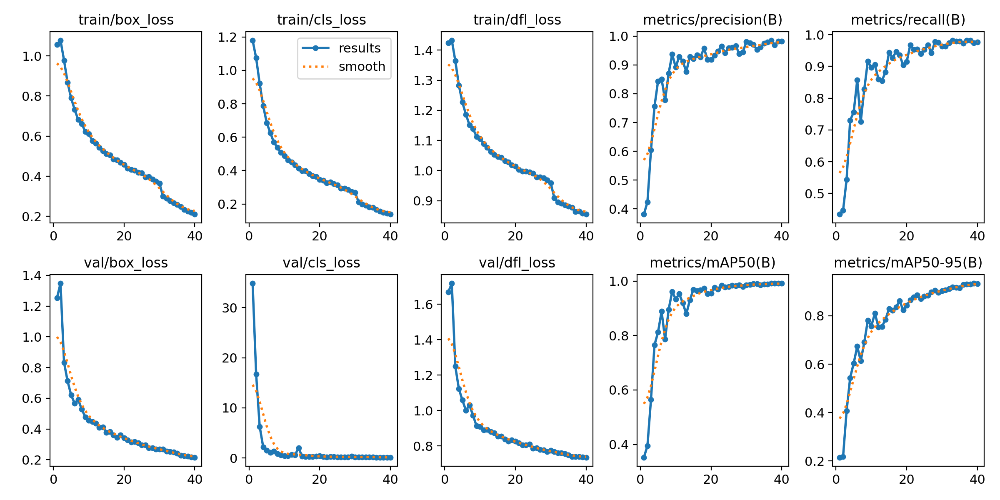

In [5]:
from IPython.display import Image

TRAIN_RESULTS = os.path.join("runs", "detect", "train9")
VALID_RESULTS = os.path.join("runs", "detect", "train92")

Image(filename=os.path.join(TRAIN_RESULTS, 'results.png'), width=1000)

In [6]:
import pandas as pd
results = pd.read_csv(os.path.join(TRAIN_RESULTS, 'results.csv'))
results.head()

,epoch,train/box_loss,train/cls_loss,train/dfl_loss,metrics/precision(B),metrics/recall(B),metrics/mAP50(B),metrics/mAP50-95(B),val/box_loss,val/cls_loss,val/dfl_loss,lr/pg0,lr/pg1,lr/pg2
0,1,1.05730,1.18060,1.4241,0.38164,0.43475,0.35242,0.21454,1.25300,34.8460,1.6677,0.000555,0.000555,0.000555
1,2,1.07810,1.07400,1.4330,0.42431,0.44704,0.39483,0.21786,1.34800,16.7170,1.7178,0.001083,0.001083,0.001083
2,3,0.97808,0.92149,1.3643,0.60405,0.54442,0.56481,0.40769,0.83339,6.2857,1.2484,0.001584,0.001584,0.001584
3,4,0.86767,0.78699,1.2831,0.75629,0.73028,0.76565,0.54352,0.71228,2.1857,1.1221,0.001543,0.001543,0.001543
4,5,0.78960,0.68603,1.2271,0.84346,0.75602,0.81241,0.60379,0.62198,1.4879,1.0579,0.001502,0.001502,0.001502


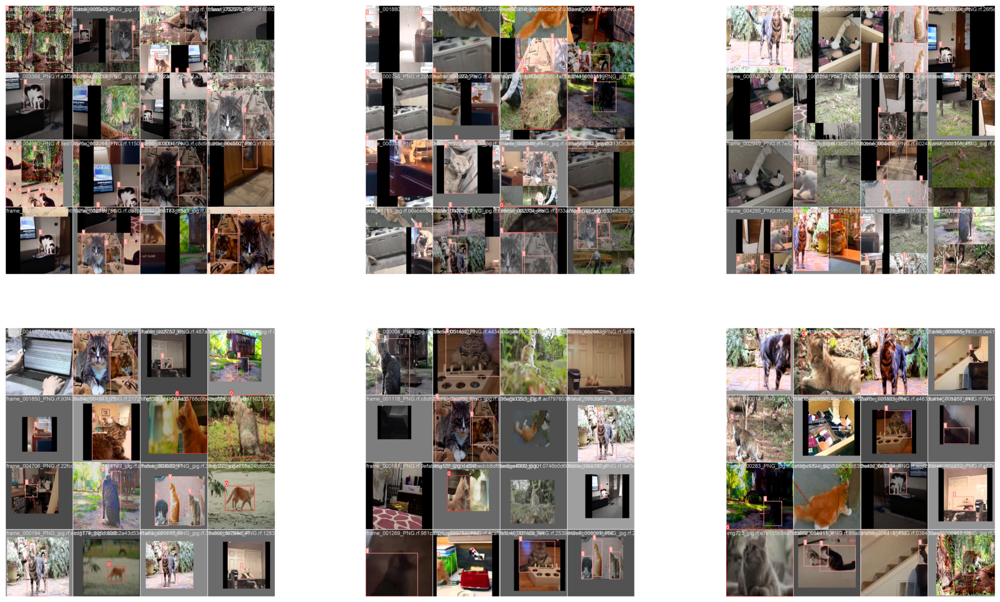

In [7]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 3, figsize=(24, 14))

axs[0, 0].imshow(plt.imread(os.path.join(TRAIN_RESULTS, "train_batch0.jpg")))
axs[0, 0].axis('off')
axs[0, 1].imshow(plt.imread(os.path.join(TRAIN_RESULTS, "train_batch1.jpg")))
axs[0, 1].axis('off')
axs[0, 2].imshow(plt.imread(os.path.join(TRAIN_RESULTS, "train_batch2.jpg")))
axs[0, 2].axis('off')
axs[1, 0].imshow(plt.imread(os.path.join(TRAIN_RESULTS, "train_batch15810.jpg")))
axs[1, 0].axis('off')
axs[1, 1].imshow(plt.imread(os.path.join(TRAIN_RESULTS, "train_batch15811.jpg")))
axs[1, 1].axis('off')
axs[1, 2].imshow(plt.imread(os.path.join(TRAIN_RESULTS, "train_batch15812.jpg")))
axs[1, 2].axis('off')

plt.show()

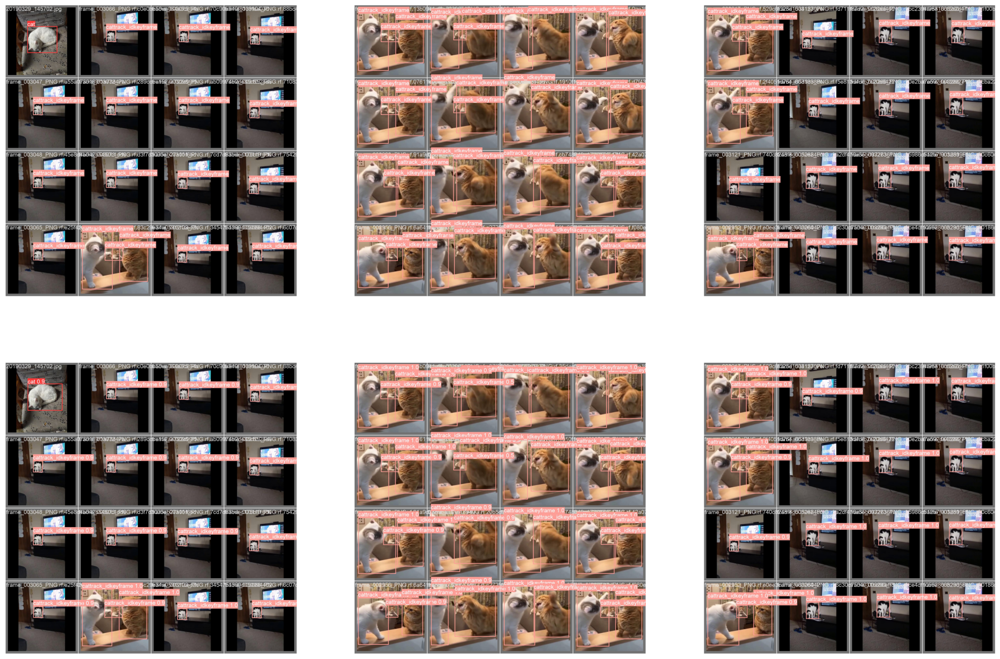

In [8]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 3, figsize=(24, 16))

axs[0, 0].imshow(plt.imread(os.path.join(VALID_RESULTS, "val_batch0_labels.jpg")))
axs[0, 0].axis('off')
axs[0, 1].imshow(plt.imread(os.path.join(VALID_RESULTS, "val_batch1_labels.jpg")))
axs[0, 1].axis('off')
axs[0, 2].imshow(plt.imread(os.path.join(VALID_RESULTS, "val_batch2_labels.jpg")))
axs[0, 2].axis('off')
axs[1, 0].imshow(plt.imread(os.path.join(VALID_RESULTS, "val_batch0_pred.jpg")))
axs[1, 0].axis('off')
axs[1, 1].imshow(plt.imread(os.path.join(VALID_RESULTS, "val_batch1_pred.jpg")))
axs[1, 1].axis('off')
axs[1, 2].imshow(plt.imread(os.path.join(VALID_RESULTS, "val_batch2_pred.jpg")))
axs[1, 2].axis('off')

plt.show()

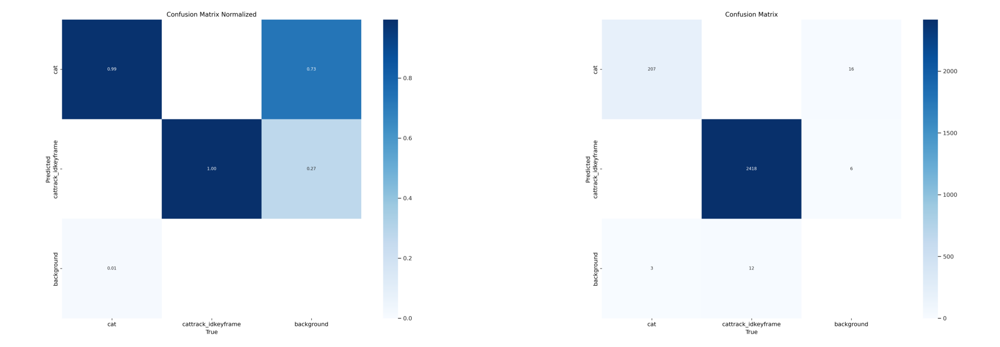

In [9]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 2, figsize=(24, 14))

axs[0].imshow(plt.imread(os.path.join(VALID_RESULTS, "confusion_matrix_normalized.png")))
axs[0].axis('off')
axs[1].imshow(plt.imread(os.path.join(VALID_RESULTS, "confusion_matrix.png")))
axs[1].axis('off')

plt.show()

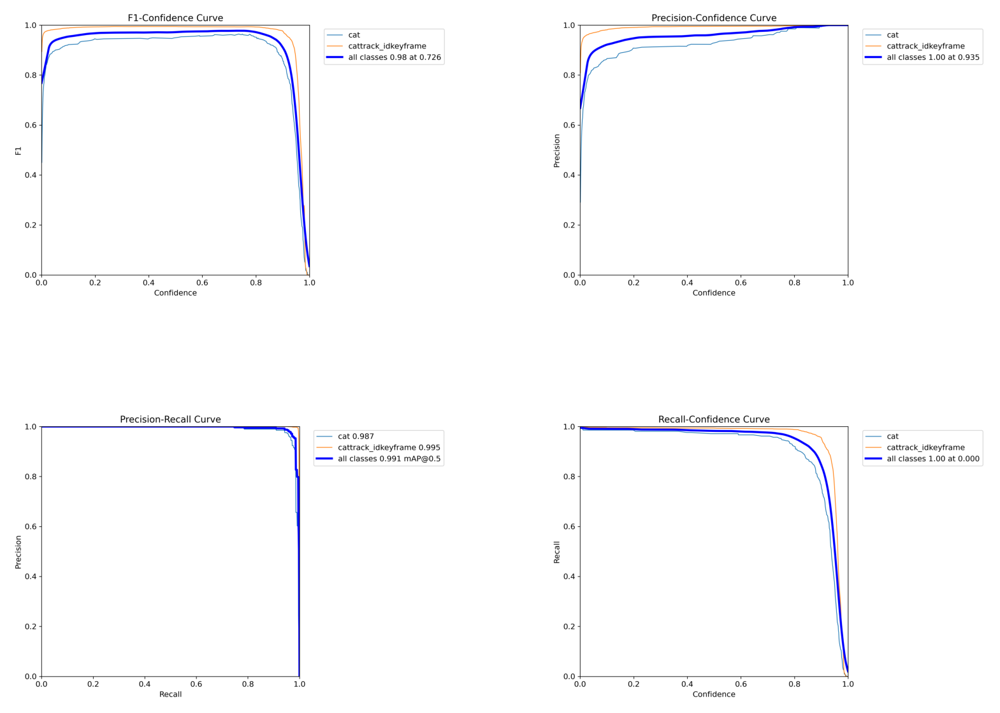

In [10]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(2, 2, figsize=(20, 15))

axs[0, 0].imshow(plt.imread(os.path.join(VALID_RESULTS, "F1_curve.png")))
axs[0, 0].axis('off')
axs[0, 1].imshow(plt.imread(os.path.join(VALID_RESULTS, "P_curve.png")))
axs[0, 1].axis('off')
axs[1, 0].imshow(plt.imread(os.path.join(VALID_RESULTS, "PR_curve.png")))
axs[1, 0].axis('off')
axs[1, 1].imshow(plt.imread(os.path.join(VALID_RESULTS, "R_curve.png")))
axs[1, 1].axis('off')

plt.show()

### 5. Manually test the model

c:\Users\ssr76\Documents\GitHub\purr\purr.imageEngine\ai

image 1/1 c:\Users\ssr76\Documents\GitHub\purr\purr.imageEngine\ai\test\images\cats\ayelt-van-veen-hbiOGtAspCY-unsplash.webp: 448x640 1 person, 2 cats, 298.0ms
Speed: 2.0ms preprocess, 298.0ms inference, 2.0ms postprocess per image at shape (1, 3, 448, 640)
['cat', 'person', 'cat']


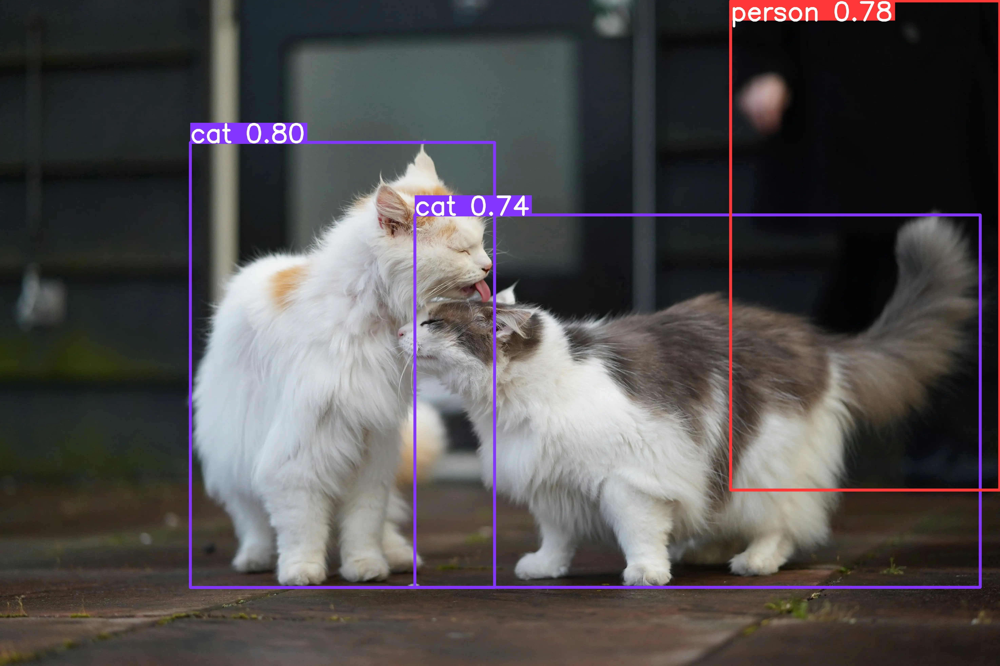

In [19]:
from time import sleep
from ultralytics import YOLO

model = YOLO("models/purr.model.pt")

print(os.getcwd())

# Test the model
result = model("test/images/cats/ayelt-van-veen-hbiOGtAspCY-unsplash.webp", conf=0.6)[0]
boxes = result.boxes
masks = result.masks
keypoints = result.keypoints
probs = result.probs
obb = result.obb
result.save_txt('result.txt')

with open('result.txt') as f:
    detections = [result.names[int(line.strip().split(' ')[0])] for line in f.readlines()]

os.remove('result.txt')

print(detections)

result.save(filename='result.jpg')
Image(filename='result.jpg', width=800)

In [20]:
os.remove('result.jpg')